# Live Perspective Transformation
This code converts video of card from perspective view to parallel view.

#### Very Important Note:
This code is based on one assumption:
1. Black smooth back ground.

For more explanation refer to the previous code at link:\
https://github.com/ashme2/ElectroPi/blob/main/Computer-Vision/Lec-03/CardPerspectiveTransformation.ipynb

In [1]:
import cv2 
import numpy as np
from matplotlib import pyplot as plt

import math

In [2]:
def distance(x1, y1, x2, y2):
    # Distance Between 2 Points
    L = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return L

In [3]:
def getPoints(img):
    # Get Black (Shape) Points
    shape_points = np.where(img < 255)
    shape_min = np.argmin(shape_points, axis=1)
    shape_max = np.argmax(shape_points, axis=1)
    i_minx = shape_min[1]
    i_miny = shape_min[0]
    i_maxx = shape_max[1]
    i_maxy = shape_max[0]

    L1 = distance(shape_points[1][i_minx], shape_points[0][i_miny], shape_points[1][i_miny], shape_points[0][i_minx])
    L2 = distance(shape_points[1][i_minx], shape_points[0][i_minx], shape_points[1][i_maxy], shape_points[0][i_maxy])

    if L1 > L2:
        p1 = [shape_points[1][i_minx], shape_points[0][i_minx]]
        p2 = [shape_points[1][i_miny], shape_points[0][i_miny]]
        p3 = [shape_points[1][i_maxx], shape_points[0][i_maxx]]
        p4 = [shape_points[1][i_maxy], shape_points[0][i_maxy]]
    else:
        p1 = [shape_points[1][i_miny], shape_points[0][i_miny]]
        p2 = [shape_points[1][i_maxx], shape_points[0][i_maxx]]
        p3 = [shape_points[1][i_maxy], shape_points[0][i_maxy]]
        p4 = [shape_points[1][i_minx], shape_points[0][i_minx]]
        
    return p1, p2, p3, p4

In [4]:
def live_perspective():
    cap = cv2.VideoCapture('https://ia801400.us.archive.org/22/items/card_video-S/card_video-S.mp4')
    I = 0
    while(1):
        I += 1
        print(f'Iteration No: {I}')
        ret, frame = cap.read()

        # Checking if video is playing or has finished
        if ret == True:
            img = frame.copy()
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # 0 For Gray scale
            img_2 = frame.copy()

            # Median Blur
            img_3 = img.copy()
            img_3 = cv2.medianBlur(img,31)

            # Adaptive Gaussian Thresholding
            img_4 = img_3.copy()
            img_4 = cv2.adaptiveThreshold(img_3,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

            # Median Blur
            img_5 = img_4.copy()
            img_5 = cv2.medianBlur(img_4,5)

            img_6 = img_5.copy()

            # Rotation of Original Image
            img_7 = img_2.copy()

            # Get Black (Shape) Points
            p1, p2, p3, p4 = getPoints(img_6)

            L14 = distance(p1[0], p1[1], p4[0], p4[1])
            L23 = distance(p2[0], p2[1], p3[0], p3[1])

            L14_L23 = L14 / L23

            if L14_L23 < 0.5 :
                print('L1,4 / L2,3 < 0.5')
                height = img_6.shape[0]   # Be Careful  that image shape starts with heigt first then width
                width = img_6.shape[1]

                shift_h = -1 * (height - max(p3[1], p4[1])) / 2
                shift_w = 1 * (width - max(p2[0], p3[0])) / 2

                # Rotation Transformation Matrix of image in X & Y
                M2 = np.float32([[1,-0.4,shift_w], [0.2,1,shift_h]])

                # The warpAffine parameter borderMode can be used to control how the background will be handled. You can set this to
                # cv2.BORDER_CONSTANT to make the background a solid color, then choose the color with the parameter borderValue.
                dst2 = cv2.warpAffine(img_6, M2,(width,height), borderValue=(255,255,255))

                # Rotation of Original Image
                img_7 = cv2.warpAffine(img_7,M2,(width,height), borderValue=(255,255,255))

                # Get Black (Shape) Points
                p1, p2, p3, p4 = getPoints(dst2)

            elif L14_L23 > 2 :
                print('L1,4 / L2,3 > 2')
                height = img_6.shape[0]   # Be Careful  that image shape starts with heigt first then width
                width = img_6.shape[1]

                shift_h = 1 * (height - max(p3[1], p4[1])) / 2
                shift_w = -1 * (width - max(p2[0], p3[0])) / 2

                # Rotation Transformation Matrix of image in X & Y
                M2 = np.float32([[1,0.4,shift_w], [-0.2,1,shift_h]])

                # The warpAffine parameter borderMode can be used to control how the background will be handled. You can set this to
                # cv2.BORDER_CONSTANT to make the background a solid color, then choose the color with the parameter borderValue.
                dst2 = cv2.warpAffine(img_6, M2,(width,height), borderValue=(255,255,255))

                # Rotation of Original Image
                img_7 = cv2.warpAffine(img_7,M2,(width,height), borderValue=(255,255,255))

                # Get Black (Shape) Points
                p1, p2, p3, p4 = getPoints(dst2)

            else:
                print('0.5 < L1,4 / L2,3 < 2')
                dst2 = img_6.copy()



            pts1 = np.float32([p1, p2, p3, p4])
            pts2 = np.float32([[0,0],[500,0],[500,300],[0,300]])
            M = cv2.getPerspectiveTransform(pts1,pts2)
            dst = cv2.warpPerspective(img_7,M,(500,300))

            # Saving Photos
            cv2.imwrite('Sample\\card_sample_' + str(I) + '_org.png',frame)
            cv2.imwrite('Sample\\card_sample_' + str(I) + '_out.png',dst)

            out_frame = frame.copy()
            out_img = dst2.copy()
            out_dst = dst.copy()

            cv2.imshow('Input',out_frame)
            cv2.imshow('Before Geting Points',out_img)
            cv2.imshow('Card',out_dst)


            # Plot Once Every 10 Times
            if (I % 10) == 0:
                print(f'P1= ({p1[0]}, {p1[1]})')
                print(f'P2= ({p2[0]}, {p2[1]})')
                print(f'P3= ({p3[0]}, {p3[1]})')
                print(f'P4= ({p4[0]}, {p4[1]})')

                plt.figure(figsize=(16, 12))
                plt.subplot(121),plt.imshow(dst2, 'gray'),plt.title('Before Geting Points')
                # put a red dot, size 20, at 2 locations:
                plt.scatter(x=[p1[0], p2[0], p3[0], p4[0]], y=[p1[1], p2[1], p3[1], p4[1]], c='r', s=20)
                # Write Point No. on Image
                plt.text(p1[0], p1[1], 'P1', bbox=dict(fill=False, edgecolor='red', linewidth=2))
                plt.text(p2[0], p2[1], 'P2', bbox=dict(fill=False, edgecolor='red', linewidth=2))
                plt.text(p3[0], p3[1], 'P3', bbox=dict(fill=False, edgecolor='red', linewidth=2))
                plt.text(p4[0], p4[1], 'P4', bbox=dict(fill=False, edgecolor='red', linewidth=2))
                plt.grid()
                plt.subplot(122),plt.imshow(dst),plt.title('Output')
                plt.show()

            if cv2.waitKey(30) & 0xFF == ord('q'):
                break

        # Breaking when video/live has finished
        else:
                break

    cv2.destroyAllWindows()
    cap.release()

Iteration No: 1
0.5 < L1,4 / L2,3 < 2
Iteration No: 2
0.5 < L1,4 / L2,3 < 2
Iteration No: 3
0.5 < L1,4 / L2,3 < 2
Iteration No: 4
0.5 < L1,4 / L2,3 < 2
Iteration No: 5
0.5 < L1,4 / L2,3 < 2
Iteration No: 6
0.5 < L1,4 / L2,3 < 2
Iteration No: 7
0.5 < L1,4 / L2,3 < 2
Iteration No: 8
0.5 < L1,4 / L2,3 < 2
Iteration No: 9
0.5 < L1,4 / L2,3 < 2
Iteration No: 10
0.5 < L1,4 / L2,3 < 2
P1= (247, 11)
P2= (667, 79)
P3= (618, 328)
P4= (138, 229)


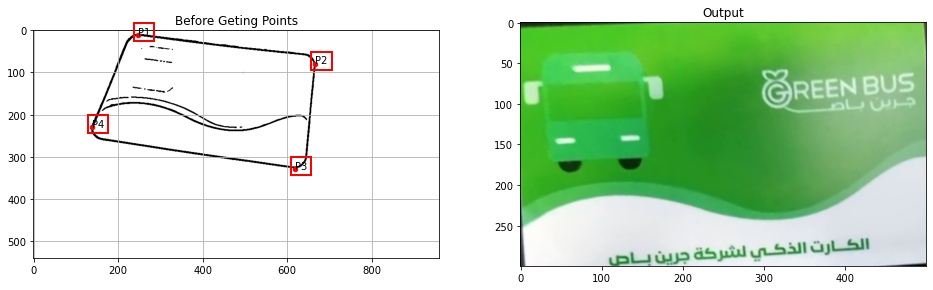

Iteration No: 11
0.5 < L1,4 / L2,3 < 2
Iteration No: 12
0.5 < L1,4 / L2,3 < 2
Iteration No: 13
0.5 < L1,4 / L2,3 < 2
Iteration No: 14
0.5 < L1,4 / L2,3 < 2
Iteration No: 15
0.5 < L1,4 / L2,3 < 2
Iteration No: 16
0.5 < L1,4 / L2,3 < 2
Iteration No: 17
0.5 < L1,4 / L2,3 < 2
Iteration No: 18
0.5 < L1,4 / L2,3 < 2
Iteration No: 19
0.5 < L1,4 / L2,3 < 2
Iteration No: 20
0.5 < L1,4 / L2,3 < 2
P1= (258, 29)
P2= (674, 102)
P3= (625, 345)
P4= (146, 251)


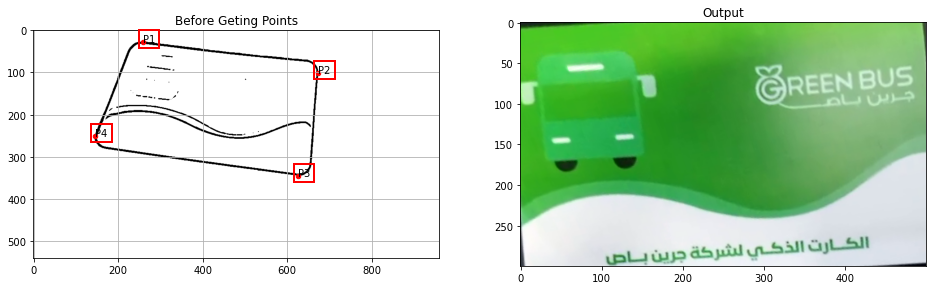

Iteration No: 21
0.5 < L1,4 / L2,3 < 2
Iteration No: 22
0.5 < L1,4 / L2,3 < 2
Iteration No: 23
0.5 < L1,4 / L2,3 < 2
Iteration No: 24
0.5 < L1,4 / L2,3 < 2
Iteration No: 25
0.5 < L1,4 / L2,3 < 2
Iteration No: 26
0.5 < L1,4 / L2,3 < 2
Iteration No: 27
0.5 < L1,4 / L2,3 < 2
Iteration No: 28
0.5 < L1,4 / L2,3 < 2
Iteration No: 29
0.5 < L1,4 / L2,3 < 2
Iteration No: 30
0.5 < L1,4 / L2,3 < 2
P1= (243, 45)
P2= (683, 106)
P3= (637, 358)
P4= (147, 278)


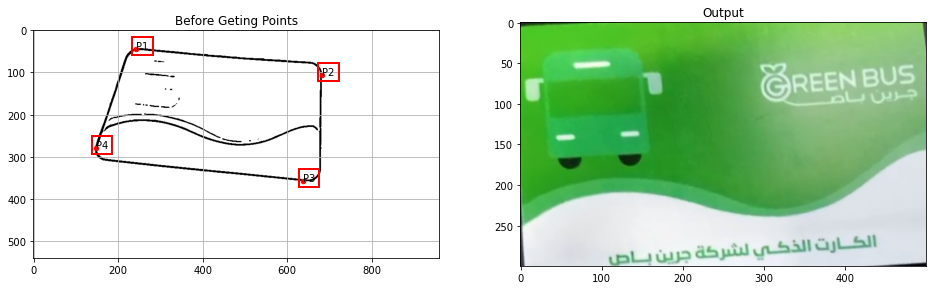

Iteration No: 31
0.5 < L1,4 / L2,3 < 2
Iteration No: 32
L1,4 / L2,3 > 2
Iteration No: 33
L1,4 / L2,3 > 2
Iteration No: 34
L1,4 / L2,3 > 2
Iteration No: 35
L1,4 / L2,3 > 2
Iteration No: 36
L1,4 / L2,3 > 2
Iteration No: 37
L1,4 / L2,3 > 2
Iteration No: 38
L1,4 / L2,3 > 2
Iteration No: 39
L1,4 / L2,3 > 2
Iteration No: 40
L1,4 / L2,3 > 2
P1= (109, 112)
P2= (565, 24)
P3= (715, 292)
P4= (169, 387)


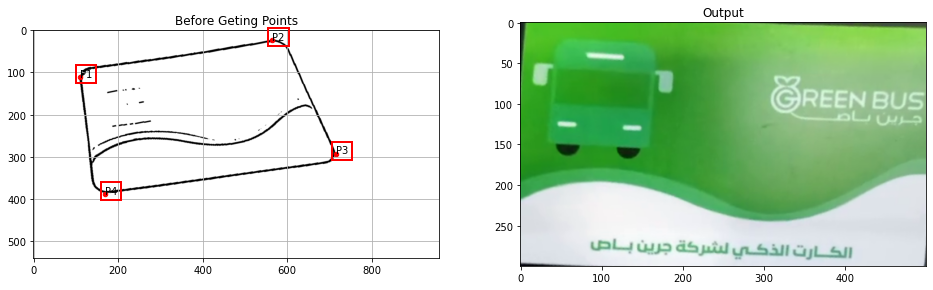

Iteration No: 41
L1,4 / L2,3 > 2
Iteration No: 42
L1,4 / L2,3 > 2
Iteration No: 43
L1,4 / L2,3 > 2
Iteration No: 44
L1,4 / L2,3 > 2
Iteration No: 45
L1,4 / L2,3 > 2
Iteration No: 46
L1,4 / L2,3 > 2
Iteration No: 47
L1,4 / L2,3 > 2
Iteration No: 48
L1,4 / L2,3 > 2
Iteration No: 49
0.5 < L1,4 / L2,3 < 2
Iteration No: 50
L1,4 / L2,3 < 0.5
P1= (310, 31)
P2= (775, 144)
P3= (676, 427)
P4= (127, 299)


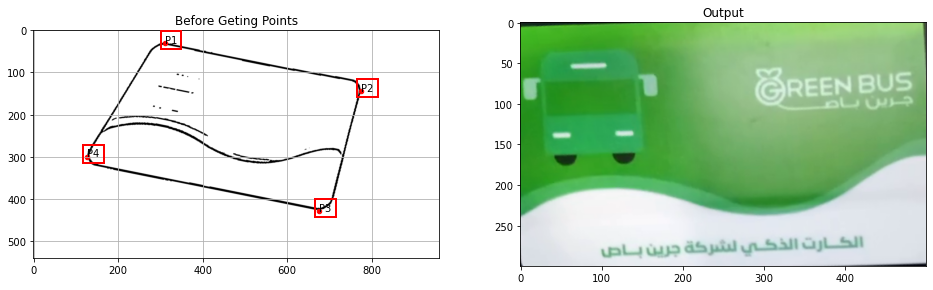

Iteration No: 51
L1,4 / L2,3 < 0.5
Iteration No: 52
L1,4 / L2,3 < 0.5
Iteration No: 53
L1,4 / L2,3 < 0.5
Iteration No: 54
L1,4 / L2,3 < 0.5
Iteration No: 55
L1,4 / L2,3 < 0.5
Iteration No: 56
L1,4 / L2,3 < 0.5
Iteration No: 57
L1,4 / L2,3 < 0.5
Iteration No: 58
L1,4 / L2,3 < 0.5
Iteration No: 59
L1,4 / L2,3 < 0.5
Iteration No: 60
L1,4 / L2,3 < 0.5
P1= (283, 26)
P2= (771, 125)
P3= (676, 416)
P4= (110, 301)


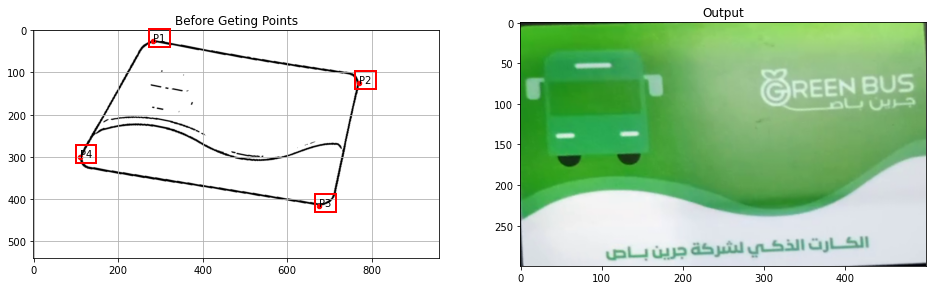

Iteration No: 61
L1,4 / L2,3 < 0.5
Iteration No: 62
L1,4 / L2,3 < 0.5
Iteration No: 63
L1,4 / L2,3 < 0.5
Iteration No: 64
L1,4 / L2,3 < 0.5
Iteration No: 65
L1,4 / L2,3 < 0.5
Iteration No: 66
L1,4 / L2,3 < 0.5
Iteration No: 67
L1,4 / L2,3 < 0.5
Iteration No: 68
L1,4 / L2,3 < 0.5
Iteration No: 69
L1,4 / L2,3 < 0.5
Iteration No: 70
L1,4 / L2,3 < 0.5
P1= (256, 59)
P2= (752, 145)
P3= (669, 438)
P4= (90, 352)


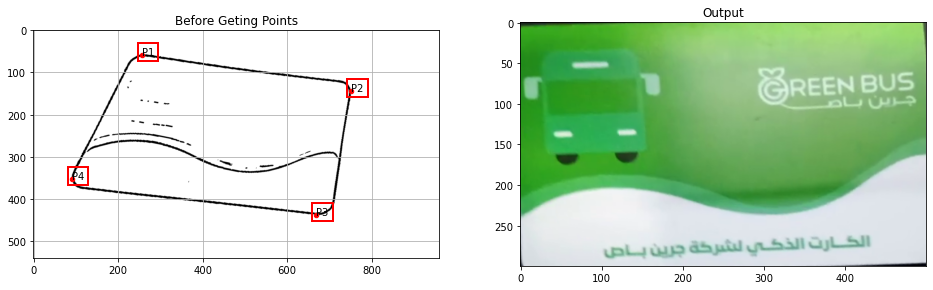

Iteration No: 71
L1,4 / L2,3 < 0.5
Iteration No: 72
L1,4 / L2,3 < 0.5
Iteration No: 73
L1,4 / L2,3 < 0.5
Iteration No: 74
L1,4 / L2,3 < 0.5
Iteration No: 75
L1,4 / L2,3 < 0.5
Iteration No: 76
L1,4 / L2,3 < 0.5
Iteration No: 77
L1,4 / L2,3 < 0.5
Iteration No: 78
L1,4 / L2,3 < 0.5
Iteration No: 79
L1,4 / L2,3 < 0.5
Iteration No: 80
L1,4 / L2,3 < 0.5
P1= (250, 103)
P2= (761, 166)
P3= (701, 464)
P4= (109, 403)


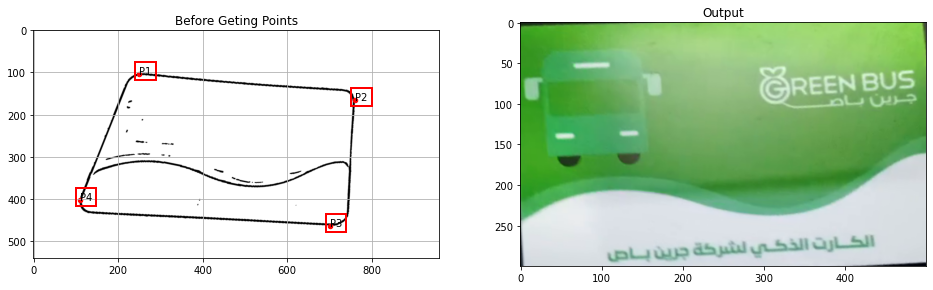

Iteration No: 81
0.5 < L1,4 / L2,3 < 2
Iteration No: 82
0.5 < L1,4 / L2,3 < 2
Iteration No: 83
0.5 < L1,4 / L2,3 < 2
Iteration No: 84
0.5 < L1,4 / L2,3 < 2
Iteration No: 85
0.5 < L1,4 / L2,3 < 2
Iteration No: 86
0.5 < L1,4 / L2,3 < 2
Iteration No: 87
0.5 < L1,4 / L2,3 < 2
Iteration No: 88
0.5 < L1,4 / L2,3 < 2
Iteration No: 89
0.5 < L1,4 / L2,3 < 2
Iteration No: 90
0.5 < L1,4 / L2,3 < 2
P1= (182, 154)
P2= (668, 51)
P3= (809, 323)
P4= (226, 463)


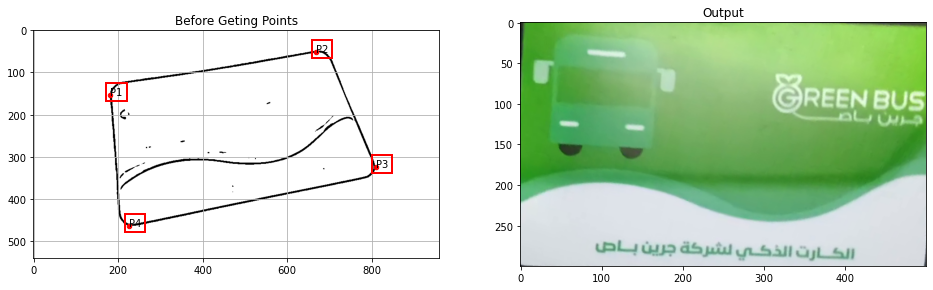

Iteration No: 91
0.5 < L1,4 / L2,3 < 2
Iteration No: 92
0.5 < L1,4 / L2,3 < 2
Iteration No: 93
0.5 < L1,4 / L2,3 < 2
Iteration No: 94
0.5 < L1,4 / L2,3 < 2
Iteration No: 95
0.5 < L1,4 / L2,3 < 2
Iteration No: 96
0.5 < L1,4 / L2,3 < 2
Iteration No: 97
0.5 < L1,4 / L2,3 < 2
Iteration No: 98
0.5 < L1,4 / L2,3 < 2
Iteration No: 99
0.5 < L1,4 / L2,3 < 2
Iteration No: 100
0.5 < L1,4 / L2,3 < 2
P1= (147, 140)
P2= (650, 19)
P3= (805, 292)
P4= (215, 469)


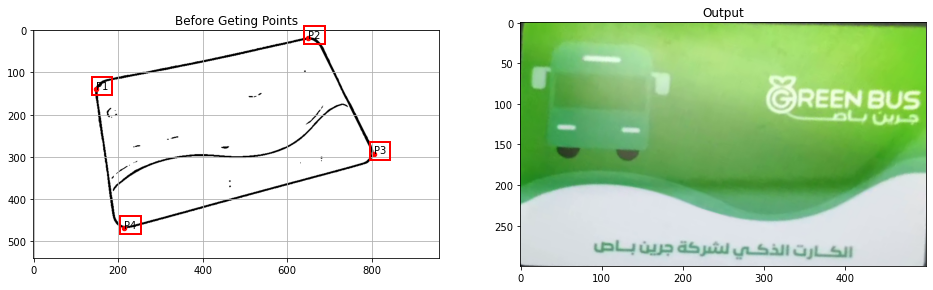

Iteration No: 101
0.5 < L1,4 / L2,3 < 2
Iteration No: 102
0.5 < L1,4 / L2,3 < 2
Iteration No: 103
0.5 < L1,4 / L2,3 < 2
Iteration No: 104
0.5 < L1,4 / L2,3 < 2
Iteration No: 105
0.5 < L1,4 / L2,3 < 2
Iteration No: 106
0.5 < L1,4 / L2,3 < 2
Iteration No: 107
0.5 < L1,4 / L2,3 < 2
Iteration No: 108
0.5 < L1,4 / L2,3 < 2
Iteration No: 109
0.5 < L1,4 / L2,3 < 2
Iteration No: 110
0.5 < L1,4 / L2,3 < 2
P1= (171, 149)
P2= (658, 21)
P3= (825, 286)
P4= (249, 471)


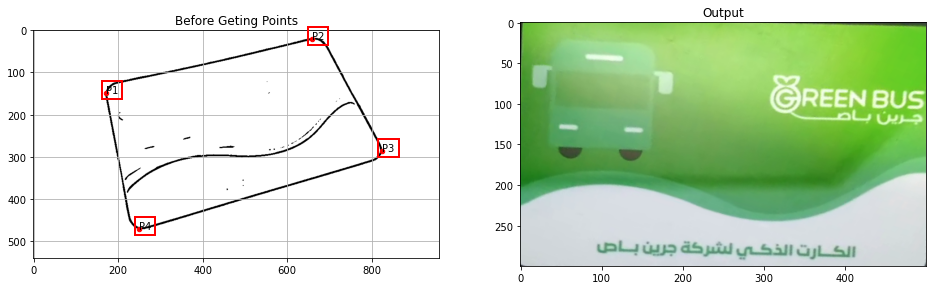

Iteration No: 111
0.5 < L1,4 / L2,3 < 2
Iteration No: 112
0.5 < L1,4 / L2,3 < 2
Iteration No: 113
0.5 < L1,4 / L2,3 < 2
Iteration No: 114
0.5 < L1,4 / L2,3 < 2
Iteration No: 115
0.5 < L1,4 / L2,3 < 2
Iteration No: 116
0.5 < L1,4 / L2,3 < 2
Iteration No: 117
0.5 < L1,4 / L2,3 < 2
Iteration No: 118
0.5 < L1,4 / L2,3 < 2
Iteration No: 119
0.5 < L1,4 / L2,3 < 2
Iteration No: 120
0.5 < L1,4 / L2,3 < 2
P1= (189, 161)
P2= (669, 21)
P3= (839, 276)
P4= (283, 477)


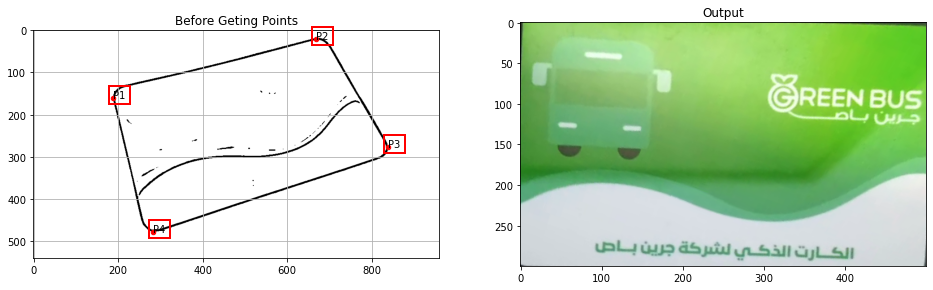

Iteration No: 121
0.5 < L1,4 / L2,3 < 2
Iteration No: 122
0.5 < L1,4 / L2,3 < 2
Iteration No: 123
0.5 < L1,4 / L2,3 < 2
Iteration No: 124
0.5 < L1,4 / L2,3 < 2
Iteration No: 125
0.5 < L1,4 / L2,3 < 2
Iteration No: 126
0.5 < L1,4 / L2,3 < 2
Iteration No: 127
0.5 < L1,4 / L2,3 < 2
Iteration No: 128
0.5 < L1,4 / L2,3 < 2
Iteration No: 129
0.5 < L1,4 / L2,3 < 2
Iteration No: 130
0.5 < L1,4 / L2,3 < 2
P1= (205, 151)
P2= (674, 15)
P3= (853, 261)
P4= (303, 468)


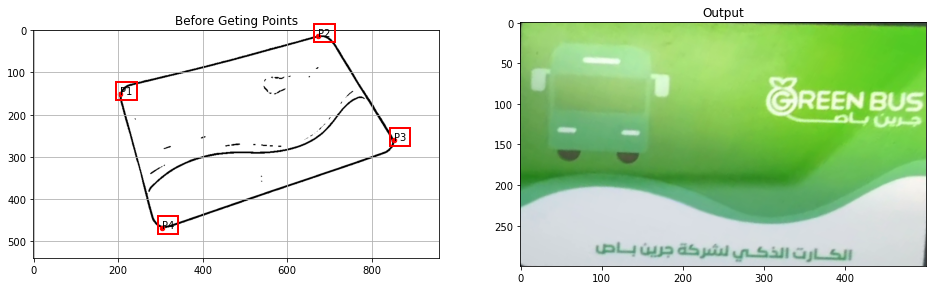

Iteration No: 131
0.5 < L1,4 / L2,3 < 2
Iteration No: 132
0.5 < L1,4 / L2,3 < 2
Iteration No: 133
0.5 < L1,4 / L2,3 < 2
Iteration No: 134
0.5 < L1,4 / L2,3 < 2
Iteration No: 135
0.5 < L1,4 / L2,3 < 2
Iteration No: 136
0.5 < L1,4 / L2,3 < 2
Iteration No: 137
0.5 < L1,4 / L2,3 < 2
Iteration No: 138
0.5 < L1,4 / L2,3 < 2
Iteration No: 139
0.5 < L1,4 / L2,3 < 2
Iteration No: 140
0.5 < L1,4 / L2,3 < 2
P1= (219, 131)
P2= (678, 0)
P3= (861, 244)
P4= (319, 443)


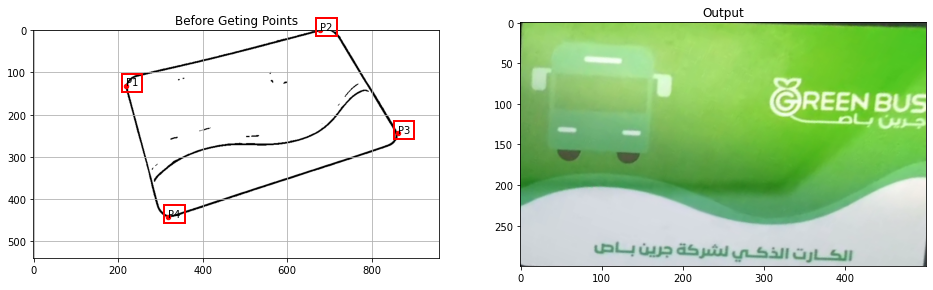

Iteration No: 141
0.5 < L1,4 / L2,3 < 2
Iteration No: 142
0.5 < L1,4 / L2,3 < 2
Iteration No: 143
0.5 < L1,4 / L2,3 < 2
Iteration No: 144
0.5 < L1,4 / L2,3 < 2
Iteration No: 145
0.5 < L1,4 / L2,3 < 2
Iteration No: 146
0.5 < L1,4 / L2,3 < 2
Iteration No: 147
0.5 < L1,4 / L2,3 < 2
Iteration No: 148
0.5 < L1,4 / L2,3 < 2
Iteration No: 149
0.5 < L1,4 / L2,3 < 2
Iteration No: 150
0.5 < L1,4 / L2,3 < 2
P1= (207, 140)
P2= (668, 16)
P3= (839, 266)
P4= (293, 451)


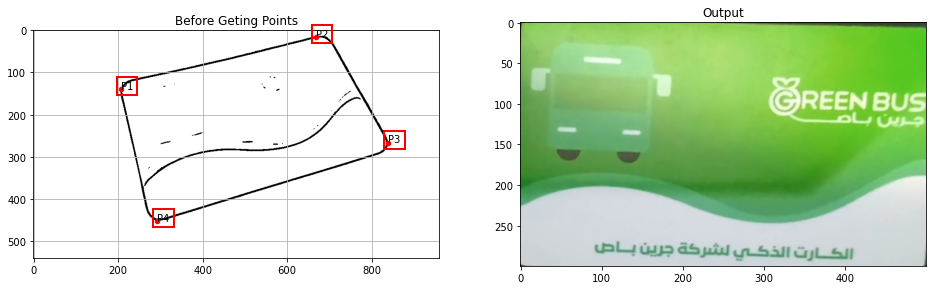

Iteration No: 151
0.5 < L1,4 / L2,3 < 2
Iteration No: 152
0.5 < L1,4 / L2,3 < 2
Iteration No: 153
0.5 < L1,4 / L2,3 < 2
Iteration No: 154
0.5 < L1,4 / L2,3 < 2
Iteration No: 155
0.5 < L1,4 / L2,3 < 2
Iteration No: 156
0.5 < L1,4 / L2,3 < 2
Iteration No: 157
0.5 < L1,4 / L2,3 < 2
Iteration No: 158
0.5 < L1,4 / L2,3 < 2
Iteration No: 159
0.5 < L1,4 / L2,3 < 2
Iteration No: 160
0.5 < L1,4 / L2,3 < 2
P1= (198, 114)
P2= (671, 9)
P3= (820, 260)
P4= (262, 415)


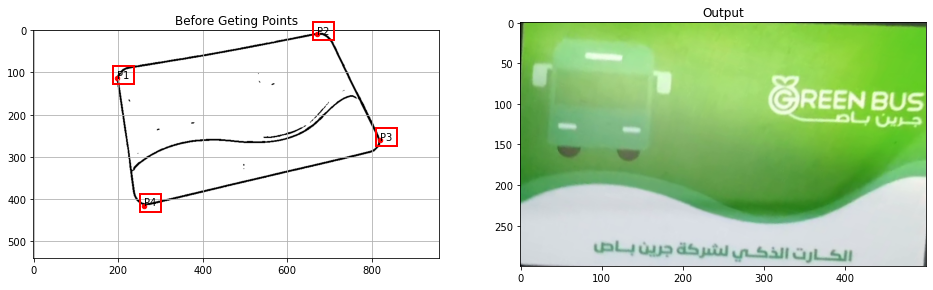

Iteration No: 161
0.5 < L1,4 / L2,3 < 2
Iteration No: 162
0.5 < L1,4 / L2,3 < 2
Iteration No: 163
0.5 < L1,4 / L2,3 < 2
Iteration No: 164
0.5 < L1,4 / L2,3 < 2
Iteration No: 165
0.5 < L1,4 / L2,3 < 2
Iteration No: 166
0.5 < L1,4 / L2,3 < 2
Iteration No: 167
0.5 < L1,4 / L2,3 < 2
Iteration No: 168
0.5 < L1,4 / L2,3 < 2
Iteration No: 169
0.5 < L1,4 / L2,3 < 2
Iteration No: 170
0.5 < L1,4 / L2,3 < 2
P1= (184, 118)
P2= (667, 28)
P3= (795, 288)
P4= (222, 418)


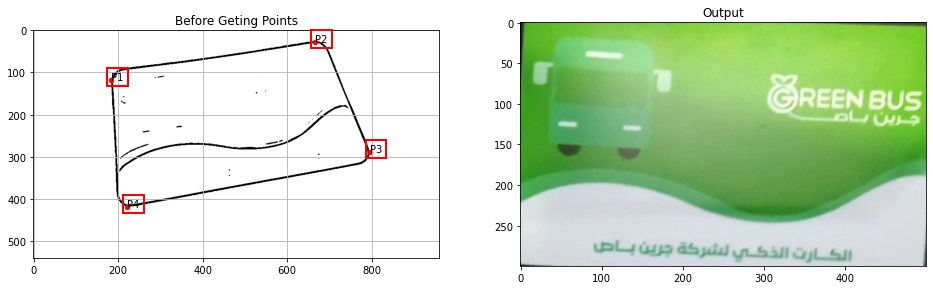

Iteration No: 171
0.5 < L1,4 / L2,3 < 2
Iteration No: 172
0.5 < L1,4 / L2,3 < 2
Iteration No: 173
0.5 < L1,4 / L2,3 < 2
Iteration No: 174
0.5 < L1,4 / L2,3 < 2
Iteration No: 175
0.5 < L1,4 / L2,3 < 2
Iteration No: 176
L1,4 / L2,3 < 0.5
Iteration No: 177
L1,4 / L2,3 < 0.5
Iteration No: 178
L1,4 / L2,3 < 0.5
Iteration No: 179
L1,4 / L2,3 < 0.5
Iteration No: 180
L1,4 / L2,3 < 0.5
P1= (252, 73)
P2= (762, 149)
P3= (694, 445)
P4= (100, 366)


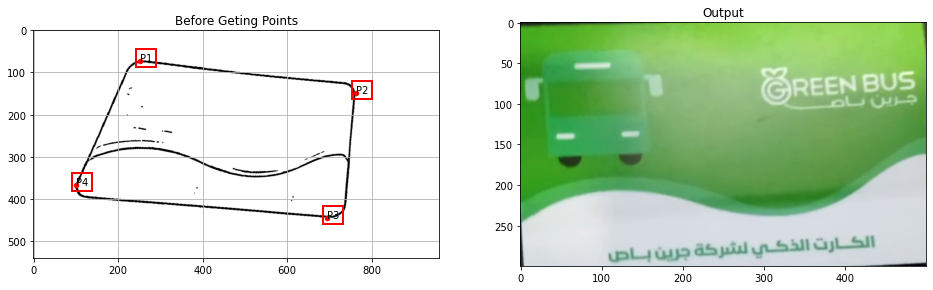

Iteration No: 181
L1,4 / L2,3 < 0.5
Iteration No: 182
L1,4 / L2,3 < 0.5
Iteration No: 183
L1,4 / L2,3 < 0.5
Iteration No: 184
L1,4 / L2,3 < 0.5
Iteration No: 185
L1,4 / L2,3 < 0.5
Iteration No: 186
L1,4 / L2,3 < 0.5
Iteration No: 187
L1,4 / L2,3 < 0.5
Iteration No: 188
L1,4 / L2,3 < 0.5
Iteration No: 189
L1,4 / L2,3 < 0.5
Iteration No: 190
L1,4 / L2,3 < 0.5
P1= (298, 4)
P2= (800, 114)
P3= (703, 415)
P4= (124, 288)


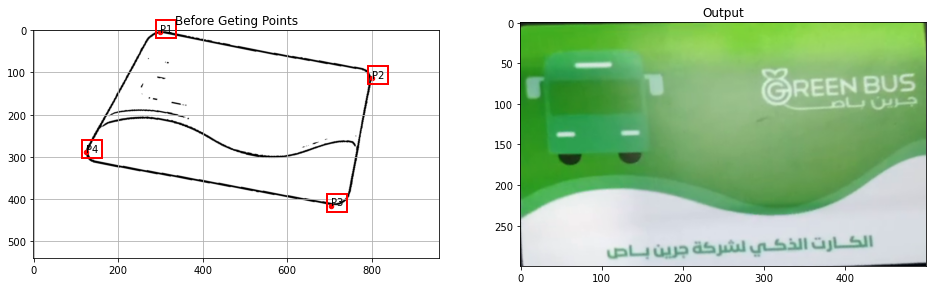

Iteration No: 191
L1,4 / L2,3 < 0.5
Iteration No: 192
L1,4 / L2,3 < 0.5
Iteration No: 193
L1,4 / L2,3 < 0.5
Iteration No: 194
L1,4 / L2,3 < 0.5
Iteration No: 195
0.5 < L1,4 / L2,3 < 2
Iteration No: 196
0.5 < L1,4 / L2,3 < 2
Iteration No: 197
L1,4 / L2,3 > 2
Iteration No: 198
L1,4 / L2,3 > 2
Iteration No: 199
L1,4 / L2,3 > 2
Iteration No: 200
L1,4 / L2,3 > 2
P1= (191, 104)
P2= (639, 0)
P3= (849, 273)
P4= (279, 399)


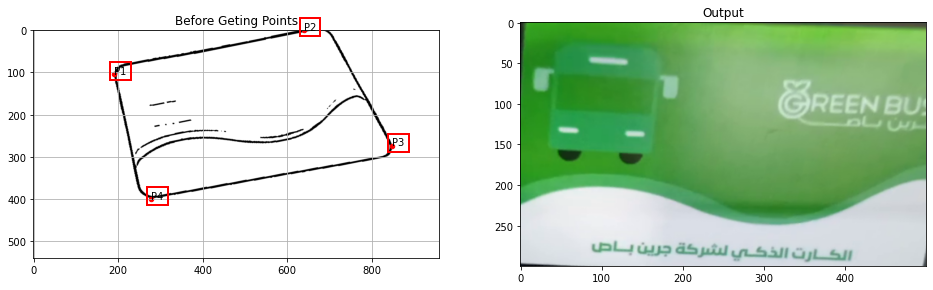

Iteration No: 201
L1,4 / L2,3 > 2
Iteration No: 202
L1,4 / L2,3 > 2
Iteration No: 203
L1,4 / L2,3 > 2
Iteration No: 204
L1,4 / L2,3 > 2
Iteration No: 205
L1,4 / L2,3 > 2
Iteration No: 206
L1,4 / L2,3 > 2
Iteration No: 207
L1,4 / L2,3 > 2
Iteration No: 208
L1,4 / L2,3 > 2
Iteration No: 209
L1,4 / L2,3 > 2
Iteration No: 210
L1,4 / L2,3 > 2
P1= (194, 107)
P2= (662, 1)
P3= (828, 278)
P4= (275, 392)


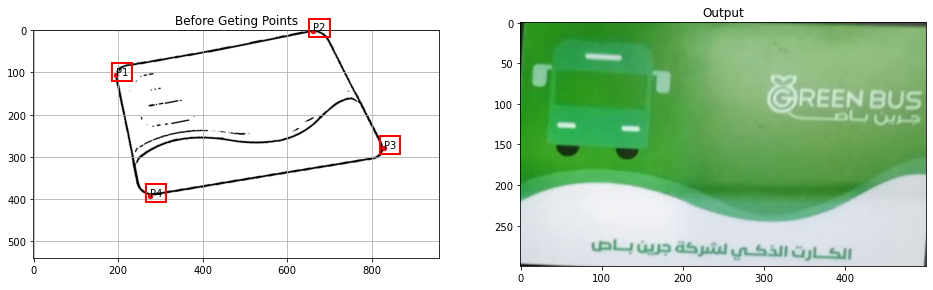

Iteration No: 211
L1,4 / L2,3 > 2
Iteration No: 212
L1,4 / L2,3 > 2
Iteration No: 213
L1,4 / L2,3 > 2
Iteration No: 214
L1,4 / L2,3 > 2
Iteration No: 215
L1,4 / L2,3 > 2
Iteration No: 216
L1,4 / L2,3 > 2
Iteration No: 217
L1,4 / L2,3 > 2
Iteration No: 218
L1,4 / L2,3 > 2
Iteration No: 219
L1,4 / L2,3 > 2
Iteration No: 220
L1,4 / L2,3 > 2
P1= (205, 90)
P2= (600, 0)
P3= (840, 266)
P4= (289, 377)


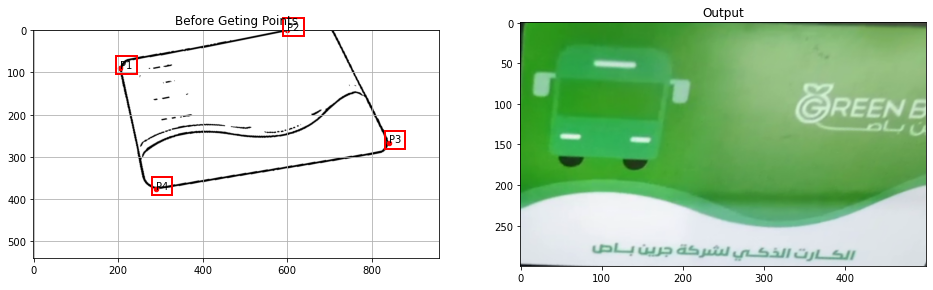

Iteration No: 221
L1,4 / L2,3 > 2
Iteration No: 222
L1,4 / L2,3 > 2
Iteration No: 223
L1,4 / L2,3 > 2
Iteration No: 224
L1,4 / L2,3 > 2
Iteration No: 225
L1,4 / L2,3 > 2
Iteration No: 226
L1,4 / L2,3 > 2
Iteration No: 227
L1,4 / L2,3 > 2
Iteration No: 228
L1,4 / L2,3 > 2
Iteration No: 229
L1,4 / L2,3 > 2
Iteration No: 230
L1,4 / L2,3 > 2
P1= (214, 87)
P2= (578, 0)
P3= (840, 260)
P4= (297, 369)


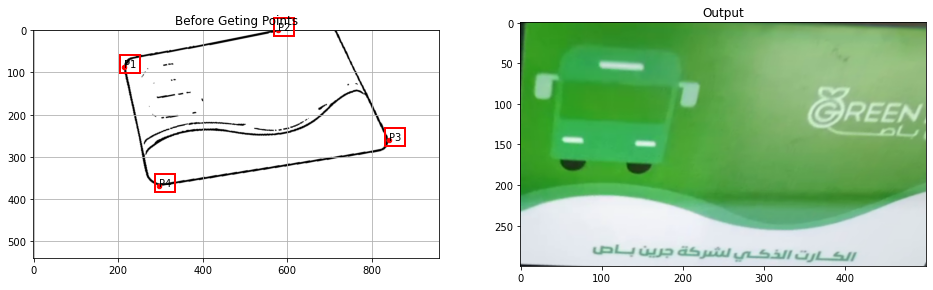

Iteration No: 231
L1,4 / L2,3 > 2
Iteration No: 232
L1,4 / L2,3 > 2
Iteration No: 233
L1,4 / L2,3 > 2
Iteration No: 234
L1,4 / L2,3 > 2
Iteration No: 235
L1,4 / L2,3 > 2
Iteration No: 236
L1,4 / L2,3 > 2
Iteration No: 237
L1,4 / L2,3 > 2
Iteration No: 238
L1,4 / L2,3 > 2
Iteration No: 239
L1,4 / L2,3 > 2
Iteration No: 240
L1,4 / L2,3 > 2
P1= (211, 86)
P2= (580, 0)
P3= (817, 260)
P4= (291, 364)


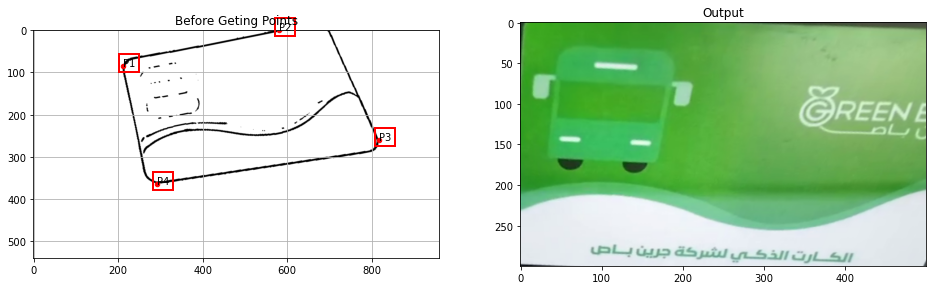

Iteration No: 241
L1,4 / L2,3 > 2
Iteration No: 242
L1,4 / L2,3 > 2
Iteration No: 243
L1,4 / L2,3 > 2
Iteration No: 244
L1,4 / L2,3 > 2
Iteration No: 245
L1,4 / L2,3 > 2
Iteration No: 246
L1,4 / L2,3 > 2
Iteration No: 247
L1,4 / L2,3 > 2
Iteration No: 248
L1,4 / L2,3 > 2
Iteration No: 249
L1,4 / L2,3 > 2
Iteration No: 250
L1,4 / L2,3 > 2
P1= (216, 89)
P2= (577, 0)
P3= (807, 258)
P4= (291, 356)


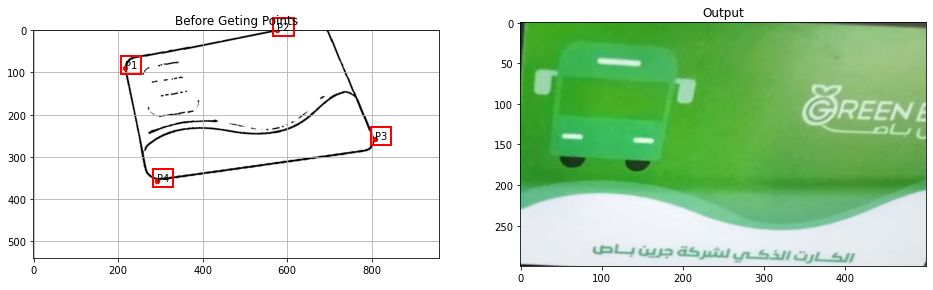

Iteration No: 251
L1,4 / L2,3 > 2
Iteration No: 252
L1,4 / L2,3 > 2
Iteration No: 253
L1,4 / L2,3 > 2
Iteration No: 254
L1,4 / L2,3 > 2
Iteration No: 255
0.5 < L1,4 / L2,3 < 2
Iteration No: 256
L1,4 / L2,3 > 2
Iteration No: 257
L1,4 / L2,3 > 2
Iteration No: 258
0.5 < L1,4 / L2,3 < 2
Iteration No: 259
0.5 < L1,4 / L2,3 < 2
Iteration No: 260
L1,4 / L2,3 > 2
P1= (242, 71)
P2= (548, 0)
P3= (826, 252)
P4= (321, 339)


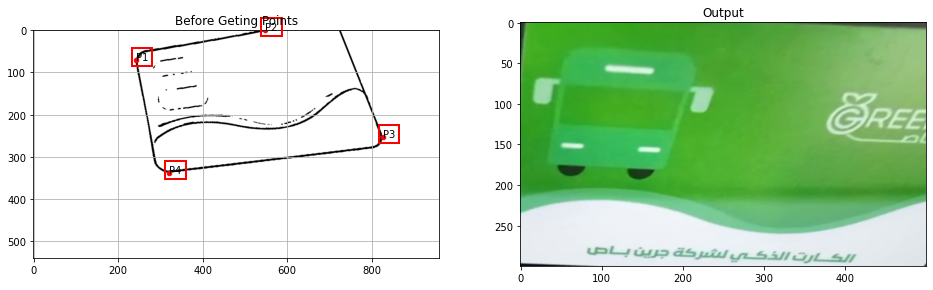

Iteration No: 261
0.5 < L1,4 / L2,3 < 2
Iteration No: 262
0.5 < L1,4 / L2,3 < 2
Iteration No: 263
0.5 < L1,4 / L2,3 < 2
Iteration No: 264
0.5 < L1,4 / L2,3 < 2
Iteration No: 265
0.5 < L1,4 / L2,3 < 2
Iteration No: 266
0.5 < L1,4 / L2,3 < 2
Iteration No: 267
0.5 < L1,4 / L2,3 < 2
Iteration No: 268
0.5 < L1,4 / L2,3 < 2
Iteration No: 269
0.5 < L1,4 / L2,3 < 2
Iteration No: 270
0.5 < L1,4 / L2,3 < 2
P1= (358, 12)
P2= (795, 46)
P3= (745, 327)
P4= (273, 258)


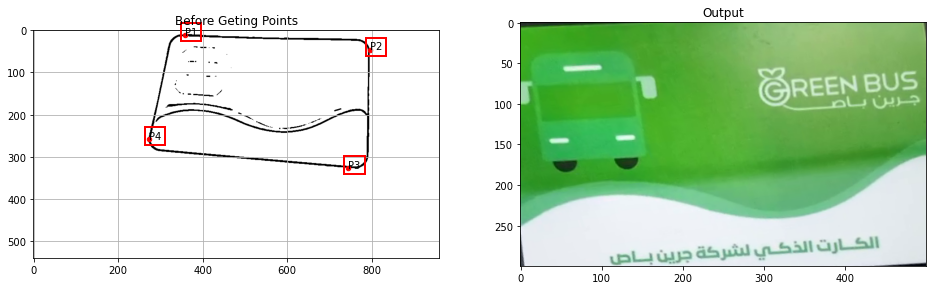

Iteration No: 271
0.5 < L1,4 / L2,3 < 2
Iteration No: 272
0.5 < L1,4 / L2,3 < 2
Iteration No: 273
0.5 < L1,4 / L2,3 < 2
Iteration No: 274
0.5 < L1,4 / L2,3 < 2
Iteration No: 275
0.5 < L1,4 / L2,3 < 2
Iteration No: 276
0.5 < L1,4 / L2,3 < 2
Iteration No: 277
0.5 < L1,4 / L2,3 < 2
Iteration No: 278
0.5 < L1,4 / L2,3 < 2
Iteration No: 279
0.5 < L1,4 / L2,3 < 2
Iteration No: 280
0.5 < L1,4 / L2,3 < 2
P1= (348, 5)
P2= (796, 61)
P3= (755, 324)
P4= (272, 250)


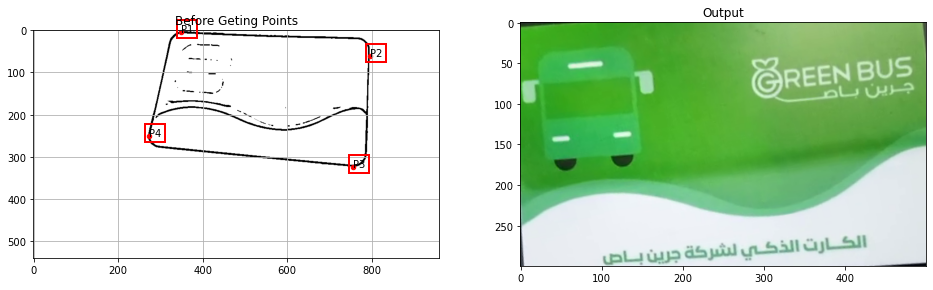

Iteration No: 281
0.5 < L1,4 / L2,3 < 2
Iteration No: 282
0.5 < L1,4 / L2,3 < 2
Iteration No: 283
0.5 < L1,4 / L2,3 < 2
Iteration No: 284
0.5 < L1,4 / L2,3 < 2
Iteration No: 285
0.5 < L1,4 / L2,3 < 2
Iteration No: 286
0.5 < L1,4 / L2,3 < 2
Iteration No: 287
0.5 < L1,4 / L2,3 < 2
Iteration No: 288
0.5 < L1,4 / L2,3 < 2
Iteration No: 289
0.5 < L1,4 / L2,3 < 2
Iteration No: 290
0.5 < L1,4 / L2,3 < 2
P1= (343, 2)
P2= (791, 44)
P3= (737, 325)
P4= (266, 242)


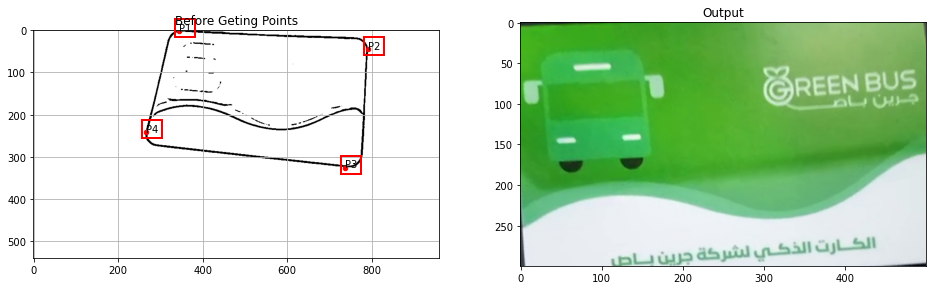

Iteration No: 291
0.5 < L1,4 / L2,3 < 2
Iteration No: 292
0.5 < L1,4 / L2,3 < 2
Iteration No: 293
0.5 < L1,4 / L2,3 < 2
Iteration No: 294
0.5 < L1,4 / L2,3 < 2
Iteration No: 295
0.5 < L1,4 / L2,3 < 2
Iteration No: 296
0.5 < L1,4 / L2,3 < 2
Iteration No: 297
0.5 < L1,4 / L2,3 < 2
Iteration No: 298
0.5 < L1,4 / L2,3 < 2
Iteration No: 299
0.5 < L1,4 / L2,3 < 2
Iteration No: 300
0.5 < L1,4 / L2,3 < 2
P1= (356, 18)
P2= (801, 67)
P3= (746, 352)
P4= (272, 258)


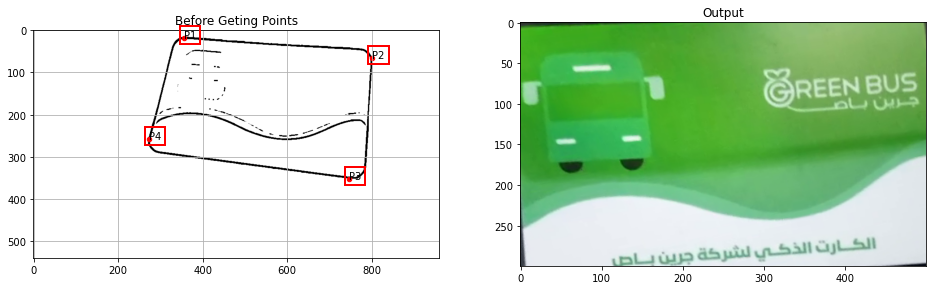

Iteration No: 301
0.5 < L1,4 / L2,3 < 2
Iteration No: 302
0.5 < L1,4 / L2,3 < 2
Iteration No: 303
0.5 < L1,4 / L2,3 < 2
Iteration No: 304
0.5 < L1,4 / L2,3 < 2
Iteration No: 305
0.5 < L1,4 / L2,3 < 2
Iteration No: 306
0.5 < L1,4 / L2,3 < 2
Iteration No: 307
0.5 < L1,4 / L2,3 < 2
Iteration No: 308
0.5 < L1,4 / L2,3 < 2
Iteration No: 309
0.5 < L1,4 / L2,3 < 2
Iteration No: 310
0.5 < L1,4 / L2,3 < 2
P1= (380, 22)
P2= (813, 87)
P3= (750, 364)
P4= (283, 260)


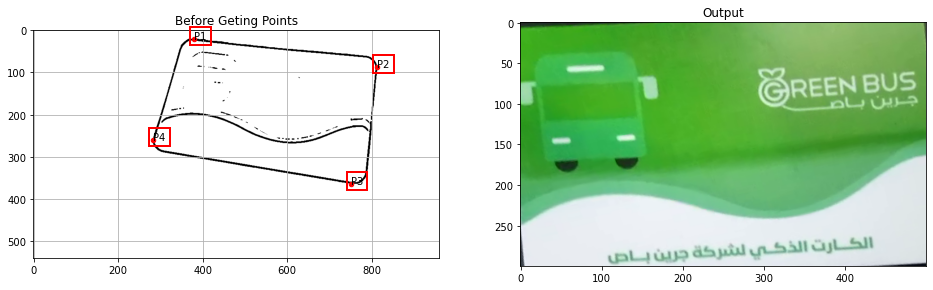

Iteration No: 311
0.5 < L1,4 / L2,3 < 2
Iteration No: 312
0.5 < L1,4 / L2,3 < 2
Iteration No: 313
0.5 < L1,4 / L2,3 < 2
Iteration No: 314
0.5 < L1,4 / L2,3 < 2
Iteration No: 315
0.5 < L1,4 / L2,3 < 2
Iteration No: 316
0.5 < L1,4 / L2,3 < 2
Iteration No: 317
0.5 < L1,4 / L2,3 < 2
Iteration No: 318
0.5 < L1,4 / L2,3 < 2
Iteration No: 319
0.5 < L1,4 / L2,3 < 2
Iteration No: 320
0.5 < L1,4 / L2,3 < 2
P1= (380, 14)
P2= (817, 89)
P3= (747, 364)
P4= (290, 251)


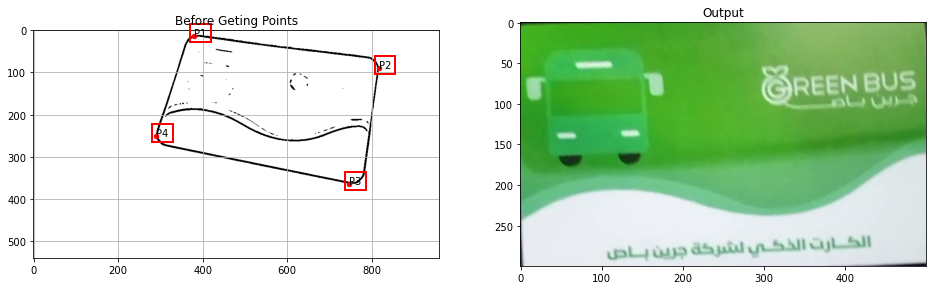

Iteration No: 321
0.5 < L1,4 / L2,3 < 2
Iteration No: 322
0.5 < L1,4 / L2,3 < 2
Iteration No: 323
0.5 < L1,4 / L2,3 < 2
Iteration No: 324
0.5 < L1,4 / L2,3 < 2
Iteration No: 325
0.5 < L1,4 / L2,3 < 2
Iteration No: 326
0.5 < L1,4 / L2,3 < 2
Iteration No: 327
0.5 < L1,4 / L2,3 < 2
Iteration No: 328
0.5 < L1,4 / L2,3 < 2
Iteration No: 329
0.5 < L1,4 / L2,3 < 2
Iteration No: 330
0.5 < L1,4 / L2,3 < 2
P1= (403, 44)
P2= (828, 125)
P3= (761, 395)
P4= (308, 272)


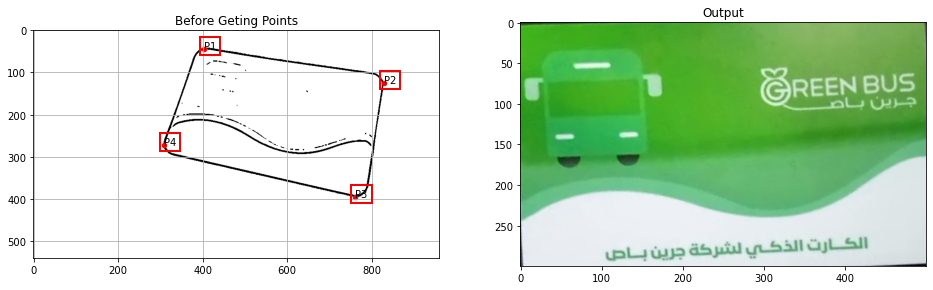

Iteration No: 331
0.5 < L1,4 / L2,3 < 2
Iteration No: 332
0.5 < L1,4 / L2,3 < 2
Iteration No: 333
0.5 < L1,4 / L2,3 < 2
Iteration No: 334
0.5 < L1,4 / L2,3 < 2
Iteration No: 335
0.5 < L1,4 / L2,3 < 2
Iteration No: 336
0.5 < L1,4 / L2,3 < 2
Iteration No: 337
0.5 < L1,4 / L2,3 < 2
Iteration No: 338
0.5 < L1,4 / L2,3 < 2
Iteration No: 339
0.5 < L1,4 / L2,3 < 2
Iteration No: 340
0.5 < L1,4 / L2,3 < 2
P1= (424, 44)
P2= (843, 135)
P3= (768, 400)
P4= (325, 263)


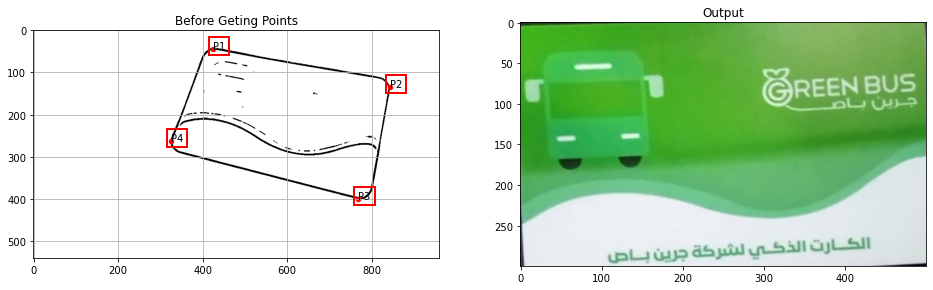

Iteration No: 341
0.5 < L1,4 / L2,3 < 2
Iteration No: 342
0.5 < L1,4 / L2,3 < 2
Iteration No: 343
0.5 < L1,4 / L2,3 < 2
Iteration No: 344
0.5 < L1,4 / L2,3 < 2
Iteration No: 345
0.5 < L1,4 / L2,3 < 2
Iteration No: 346
0.5 < L1,4 / L2,3 < 2
Iteration No: 347
0.5 < L1,4 / L2,3 < 2
Iteration No: 348
0.5 < L1,4 / L2,3 < 2
Iteration No: 349
0.5 < L1,4 / L2,3 < 2
Iteration No: 350
0.5 < L1,4 / L2,3 < 2
P1= (445, 50)
P2= (858, 149)
P3= (784, 409)
P4= (343, 265)


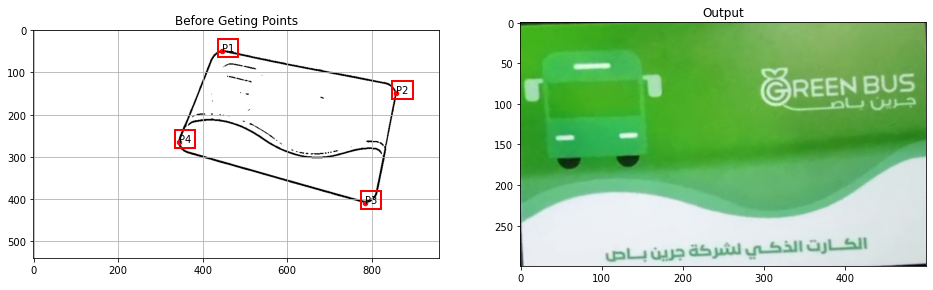

Iteration No: 351
0.5 < L1,4 / L2,3 < 2
Iteration No: 352
0.5 < L1,4 / L2,3 < 2
Iteration No: 353
0.5 < L1,4 / L2,3 < 2
Iteration No: 354
0.5 < L1,4 / L2,3 < 2
Iteration No: 355
0.5 < L1,4 / L2,3 < 2
Iteration No: 356
0.5 < L1,4 / L2,3 < 2
Iteration No: 357
0.5 < L1,4 / L2,3 < 2
Iteration No: 358
0.5 < L1,4 / L2,3 < 2
Iteration No: 359
0.5 < L1,4 / L2,3 < 2
Iteration No: 360
0.5 < L1,4 / L2,3 < 2
P1= (451, 29)
P2= (873, 133)
P3= (796, 393)
P4= (349, 244)


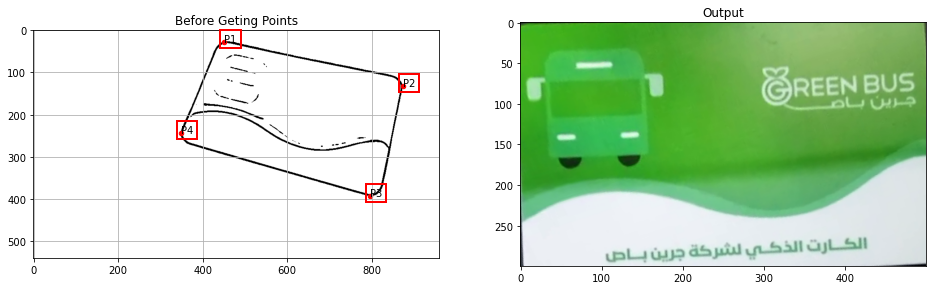

Iteration No: 361
0.5 < L1,4 / L2,3 < 2
Iteration No: 362
0.5 < L1,4 / L2,3 < 2
Iteration No: 363
0.5 < L1,4 / L2,3 < 2
Iteration No: 364
0.5 < L1,4 / L2,3 < 2
Iteration No: 365
0.5 < L1,4 / L2,3 < 2
Iteration No: 366
0.5 < L1,4 / L2,3 < 2
Iteration No: 367
0.5 < L1,4 / L2,3 < 2
Iteration No: 368
0.5 < L1,4 / L2,3 < 2
Iteration No: 369
0.5 < L1,4 / L2,3 < 2
Iteration No: 370
0.5 < L1,4 / L2,3 < 2
P1= (451, 15)
P2= (876, 119)
P3= (800, 385)
P4= (340, 236)


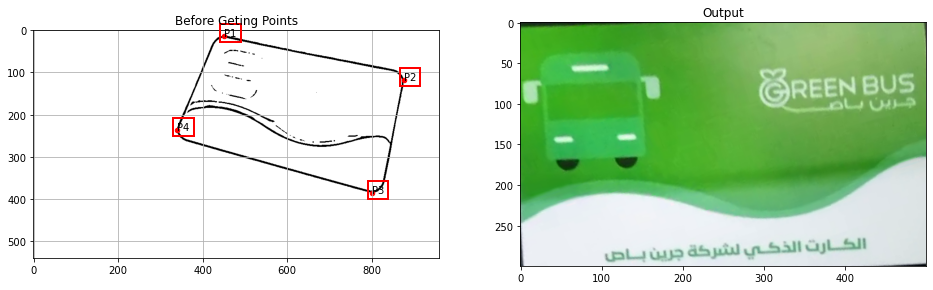

Iteration No: 371
0.5 < L1,4 / L2,3 < 2
Iteration No: 372
0.5 < L1,4 / L2,3 < 2
Iteration No: 373
0.5 < L1,4 / L2,3 < 2
Iteration No: 374
0.5 < L1,4 / L2,3 < 2
Iteration No: 375
0.5 < L1,4 / L2,3 < 2
Iteration No: 376
0.5 < L1,4 / L2,3 < 2
Iteration No: 377
0.5 < L1,4 / L2,3 < 2
Iteration No: 378
0.5 < L1,4 / L2,3 < 2
Iteration No: 379
0.5 < L1,4 / L2,3 < 2
Iteration No: 380
0.5 < L1,4 / L2,3 < 2
P1= (420, 5)
P2= (869, 108)
P3= (792, 393)
P4= (304, 240)


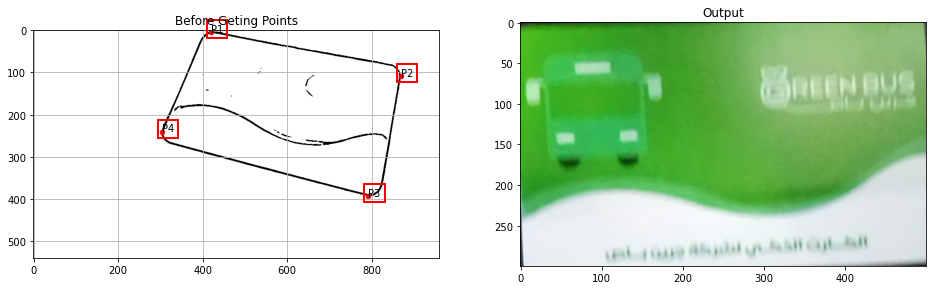

Iteration No: 381
0.5 < L1,4 / L2,3 < 2
Iteration No: 382
0.5 < L1,4 / L2,3 < 2
Iteration No: 383
0.5 < L1,4 / L2,3 < 2
Iteration No: 384
0.5 < L1,4 / L2,3 < 2
Iteration No: 385
0.5 < L1,4 / L2,3 < 2
Iteration No: 386
0.5 < L1,4 / L2,3 < 2
Iteration No: 387
0.5 < L1,4 / L2,3 < 2
Iteration No: 388
0.5 < L1,4 / L2,3 < 2
Iteration No: 389
0.5 < L1,4 / L2,3 < 2
Iteration No: 390
0.5 < L1,4 / L2,3 < 2
P1= (401, 62)
P2= (861, 159)
P3= (796, 445)
P4= (284, 293)


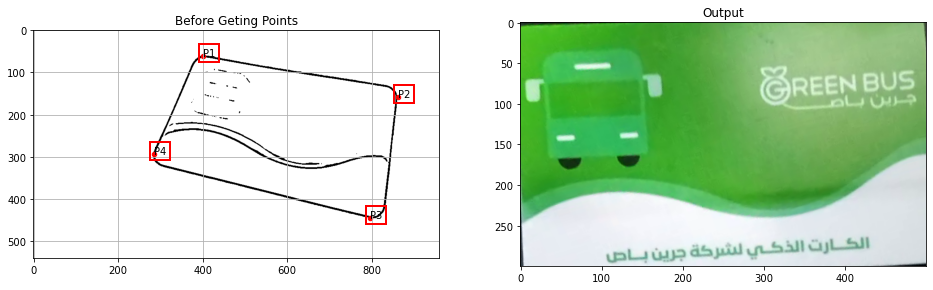

Iteration No: 391
0.5 < L1,4 / L2,3 < 2
Iteration No: 392
0.5 < L1,4 / L2,3 < 2
Iteration No: 393
0.5 < L1,4 / L2,3 < 2
Iteration No: 394
0.5 < L1,4 / L2,3 < 2
Iteration No: 395
0.5 < L1,4 / L2,3 < 2
Iteration No: 396
0.5 < L1,4 / L2,3 < 2
Iteration No: 397
0.5 < L1,4 / L2,3 < 2
Iteration No: 398
0.5 < L1,4 / L2,3 < 2
Iteration No: 399
0.5 < L1,4 / L2,3 < 2
Iteration No: 400
0.5 < L1,4 / L2,3 < 2
P1= (388, 57)
P2= (855, 148)
P3= (791, 443)
P4= (266, 294)


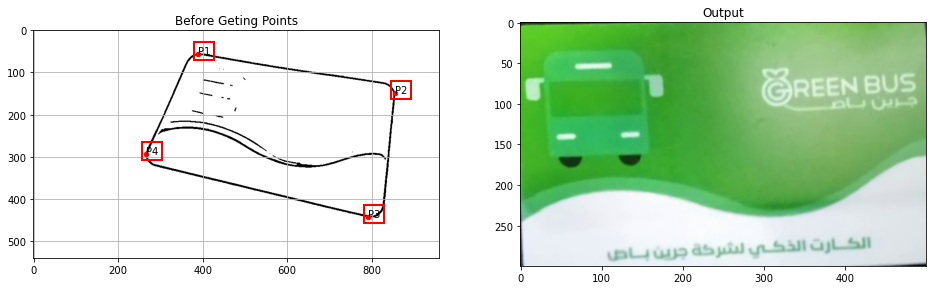

Iteration No: 401
0.5 < L1,4 / L2,3 < 2
Iteration No: 402
0.5 < L1,4 / L2,3 < 2
Iteration No: 403
0.5 < L1,4 / L2,3 < 2
Iteration No: 404
0.5 < L1,4 / L2,3 < 2
Iteration No: 405
0.5 < L1,4 / L2,3 < 2
Iteration No: 406
0.5 < L1,4 / L2,3 < 2
Iteration No: 407
0.5 < L1,4 / L2,3 < 2
Iteration No: 408
0.5 < L1,4 / L2,3 < 2
Iteration No: 409
0.5 < L1,4 / L2,3 < 2
Iteration No: 410
0.5 < L1,4 / L2,3 < 2
P1= (359, 76)
P2= (828, 171)
P3= (768, 461)
P4= (238, 312)


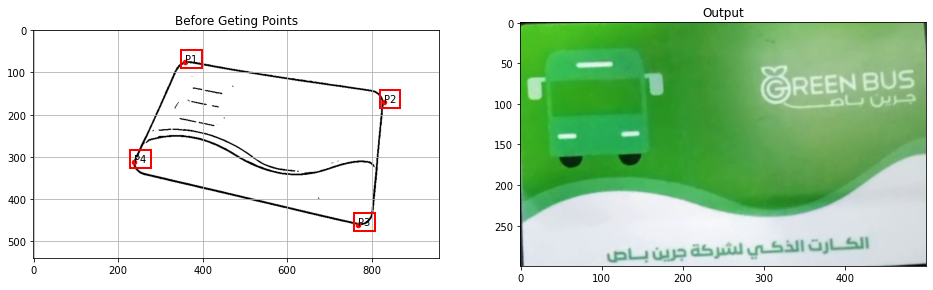

Iteration No: 411
0.5 < L1,4 / L2,3 < 2
Iteration No: 412
0.5 < L1,4 / L2,3 < 2
Iteration No: 413
0.5 < L1,4 / L2,3 < 2
Iteration No: 414
0.5 < L1,4 / L2,3 < 2
Iteration No: 415
0.5 < L1,4 / L2,3 < 2
Iteration No: 416
0.5 < L1,4 / L2,3 < 2
Iteration No: 417
0.5 < L1,4 / L2,3 < 2
Iteration No: 418
0.5 < L1,4 / L2,3 < 2
Iteration No: 419
0.5 < L1,4 / L2,3 < 2
Iteration No: 420
0.5 < L1,4 / L2,3 < 2
P1= (361, 66)
P2= (831, 159)
P3= (775, 455)
P4= (234, 305)


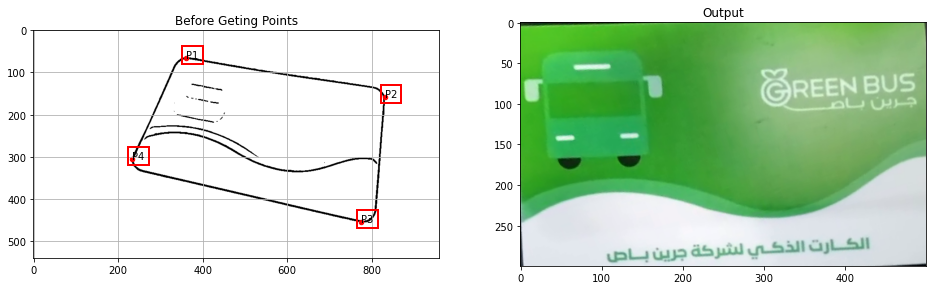

Iteration No: 421
0.5 < L1,4 / L2,3 < 2
Iteration No: 422
0.5 < L1,4 / L2,3 < 2
Iteration No: 423
0.5 < L1,4 / L2,3 < 2
Iteration No: 424
0.5 < L1,4 / L2,3 < 2
Iteration No: 425
0.5 < L1,4 / L2,3 < 2
Iteration No: 426
0.5 < L1,4 / L2,3 < 2
Iteration No: 427
0.5 < L1,4 / L2,3 < 2
Iteration No: 428
0.5 < L1,4 / L2,3 < 2
Iteration No: 429
0.5 < L1,4 / L2,3 < 2
Iteration No: 430
0.5 < L1,4 / L2,3 < 2
P1= (366, 65)
P2= (840, 162)
P3= (789, 451)
P4= (242, 304)


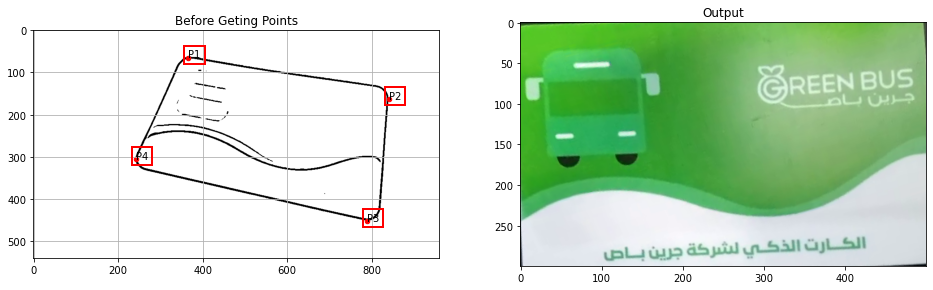

Iteration No: 431
0.5 < L1,4 / L2,3 < 2
Iteration No: 432
0.5 < L1,4 / L2,3 < 2
Iteration No: 433
0.5 < L1,4 / L2,3 < 2
Iteration No: 434
0.5 < L1,4 / L2,3 < 2
Iteration No: 435
0.5 < L1,4 / L2,3 < 2
Iteration No: 436
0.5 < L1,4 / L2,3 < 2
Iteration No: 437
0.5 < L1,4 / L2,3 < 2
Iteration No: 438
0.5 < L1,4 / L2,3 < 2
Iteration No: 439
0.5 < L1,4 / L2,3 < 2
Iteration No: 440
0.5 < L1,4 / L2,3 < 2
P1= (358, 55)
P2= (835, 148)
P3= (779, 441)
P4= (232, 295)


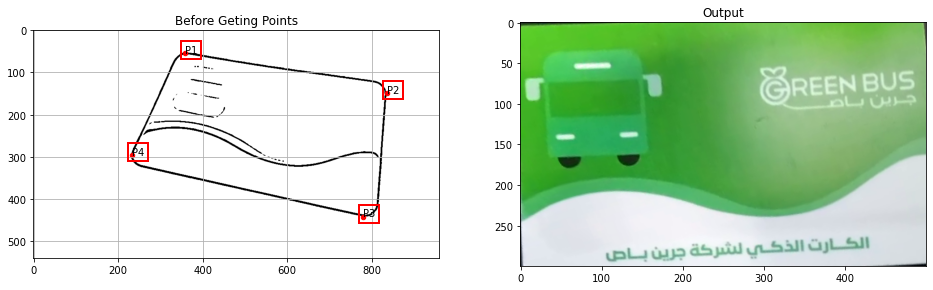

Iteration No: 441
0.5 < L1,4 / L2,3 < 2
Iteration No: 442
0.5 < L1,4 / L2,3 < 2
Iteration No: 443
0.5 < L1,4 / L2,3 < 2
Iteration No: 444
0.5 < L1,4 / L2,3 < 2
Iteration No: 445
0.5 < L1,4 / L2,3 < 2
Iteration No: 446
0.5 < L1,4 / L2,3 < 2
Iteration No: 447
0.5 < L1,4 / L2,3 < 2
Iteration No: 448
0.5 < L1,4 / L2,3 < 2
Iteration No: 449
0.5 < L1,4 / L2,3 < 2
Iteration No: 450
0.5 < L1,4 / L2,3 < 2
P1= (321, 33)
P2= (823, 122)
P3= (771, 428)
P4= (197, 292)


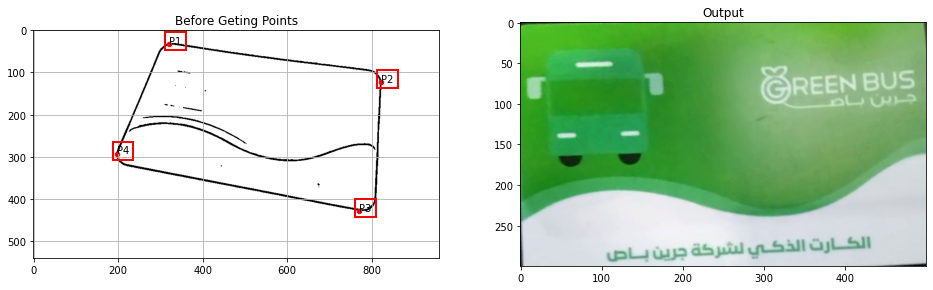

Iteration No: 451
0.5 < L1,4 / L2,3 < 2
Iteration No: 452
0.5 < L1,4 / L2,3 < 2
Iteration No: 453
0.5 < L1,4 / L2,3 < 2
Iteration No: 454
0.5 < L1,4 / L2,3 < 2
Iteration No: 455
0.5 < L1,4 / L2,3 < 2
Iteration No: 456
0.5 < L1,4 / L2,3 < 2
Iteration No: 457
L1,4 / L2,3 > 2
Iteration No: 458
L1,4 / L2,3 > 2
Iteration No: 459
L1,4 / L2,3 > 2
Iteration No: 460
L1,4 / L2,3 > 2
P1= (200, 74)
P2= (616, 0)
P3= (890, 301)
P4= (248, 377)


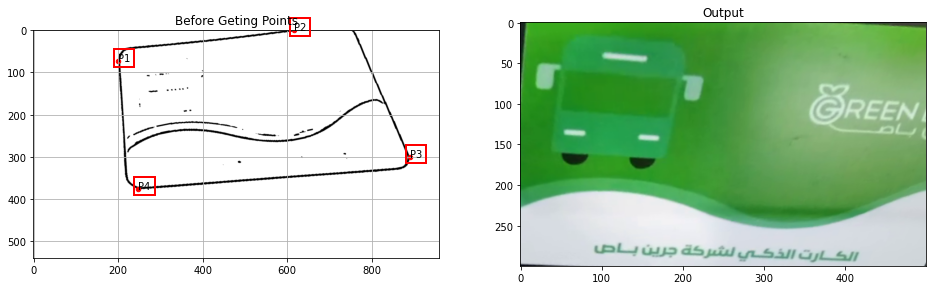

Iteration No: 461
L1,4 / L2,3 > 2
Iteration No: 462
L1,4 / L2,3 > 2
Iteration No: 463
L1,4 / L2,3 > 2
Iteration No: 464
L1,4 / L2,3 > 2
Iteration No: 465
L1,4 / L2,3 > 2
Iteration No: 466
L1,4 / L2,3 > 2
Iteration No: 467
L1,4 / L2,3 > 2
Iteration No: 468
L1,4 / L2,3 > 2
Iteration No: 469
L1,4 / L2,3 > 2
Iteration No: 470
L1,4 / L2,3 > 2
P1= (194, 90)
P2= (611, 0)
P3= (917, 294)
P4= (280, 416)


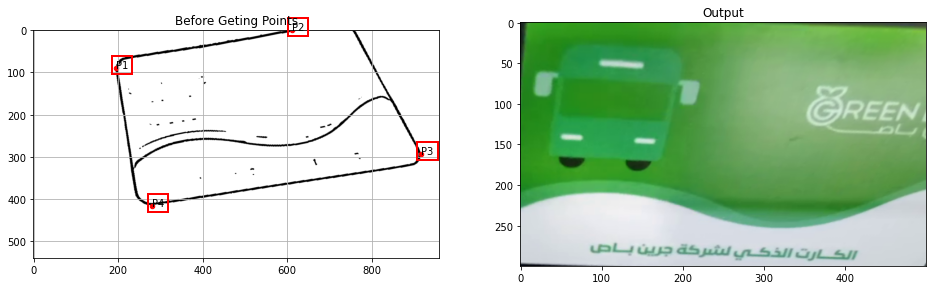

Iteration No: 471
L1,4 / L2,3 > 2
Iteration No: 472
L1,4 / L2,3 > 2
Iteration No: 473
L1,4 / L2,3 > 2
Iteration No: 474
L1,4 / L2,3 > 2
Iteration No: 475
0.5 < L1,4 / L2,3 < 2
Iteration No: 476
L1,4 / L2,3 < 0.5
Iteration No: 477
L1,4 / L2,3 < 0.5
Iteration No: 478
L1,4 / L2,3 < 0.5
Iteration No: 479
L1,4 / L2,3 < 0.5
Iteration No: 480
L1,4 / L2,3 < 0.5
P1= (275, 52)
P2= (812, 163)
P3= (724, 497)
P4= (84, 365)


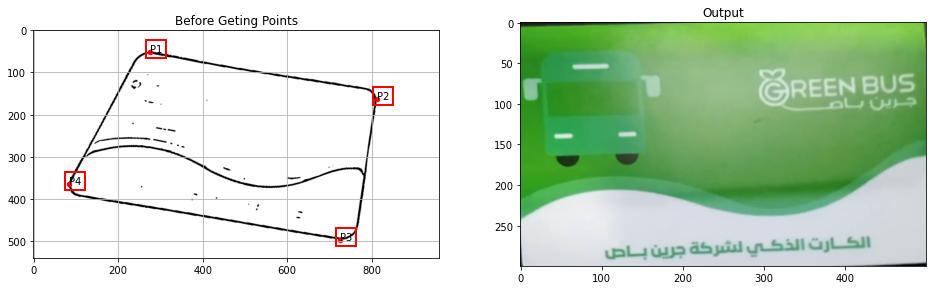

Iteration No: 481
L1,4 / L2,3 < 0.5
Iteration No: 482
L1,4 / L2,3 < 0.5
Iteration No: 483
L1,4 / L2,3 < 0.5
Iteration No: 484
L1,4 / L2,3 < 0.5
Iteration No: 485
L1,4 / L2,3 < 0.5
Iteration No: 486
L1,4 / L2,3 < 0.5
Iteration No: 487
L1,4 / L2,3 < 0.5
Iteration No: 488
L1,4 / L2,3 < 0.5
Iteration No: 489
L1,4 / L2,3 < 0.5
Iteration No: 490
L1,4 / L2,3 < 0.5
P1= (252, 73)
P2= (803, 171)
P3= (741, 490)
P4= (85, 401)


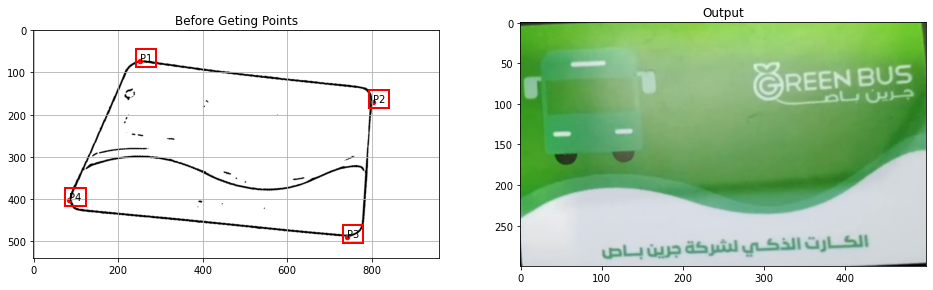

Iteration No: 491
L1,4 / L2,3 < 0.5
Iteration No: 492
L1,4 / L2,3 < 0.5
Iteration No: 493
L1,4 / L2,3 < 0.5
Iteration No: 494
L1,4 / L2,3 < 0.5
Iteration No: 495
L1,4 / L2,3 < 0.5
Iteration No: 496
L1,4 / L2,3 < 0.5
Iteration No: 497
L1,4 / L2,3 < 0.5
Iteration No: 498
L1,4 / L2,3 < 0.5
Iteration No: 499
L1,4 / L2,3 < 0.5
Iteration No: 500
L1,4 / L2,3 < 0.5
P1= (217, 129)
P2= (769, 205)
P3= (710, 518)
P4= (61, 461)


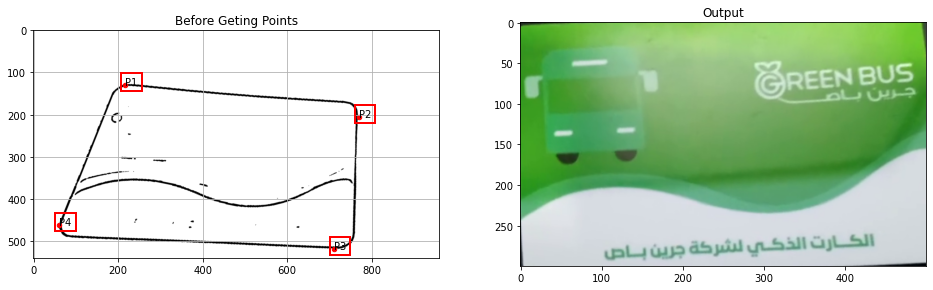

Iteration No: 501
0.5 < L1,4 / L2,3 < 2
Iteration No: 502
0.5 < L1,4 / L2,3 < 2
Iteration No: 503
0.5 < L1,4 / L2,3 < 2
Iteration No: 504
0.5 < L1,4 / L2,3 < 2
Iteration No: 505
0.5 < L1,4 / L2,3 < 2
Iteration No: 506
0.5 < L1,4 / L2,3 < 2
Iteration No: 507
0.5 < L1,4 / L2,3 < 2
Iteration No: 508
0.5 < L1,4 / L2,3 < 2
Iteration No: 509
0.5 < L1,4 / L2,3 < 2
Iteration No: 510
0.5 < L1,4 / L2,3 < 2
P1= (147, 175)
P2= (677, 50)
P3= (840, 336)
P4= (197, 518)


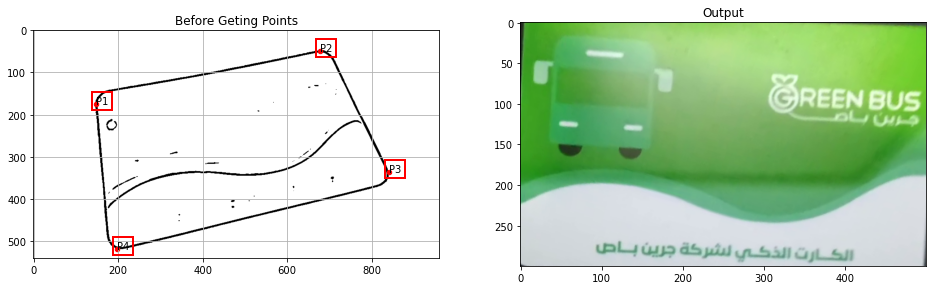

Iteration No: 511
0.5 < L1,4 / L2,3 < 2
Iteration No: 512
0.5 < L1,4 / L2,3 < 2
Iteration No: 513
0.5 < L1,4 / L2,3 < 2
Iteration No: 514
0.5 < L1,4 / L2,3 < 2
Iteration No: 515
0.5 < L1,4 / L2,3 < 2
Iteration No: 516
0.5 < L1,4 / L2,3 < 2
Iteration No: 517
0.5 < L1,4 / L2,3 < 2
Iteration No: 518
0.5 < L1,4 / L2,3 < 2
Iteration No: 519
0.5 < L1,4 / L2,3 < 2
Iteration No: 520
0.5 < L1,4 / L2,3 < 2
P1= (172, 144)
P2= (689, 24)
P3= (866, 304)
P4= (236, 486)


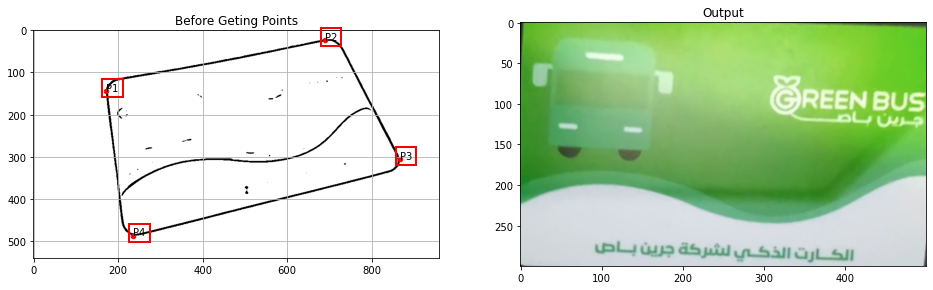

Iteration No: 521
0.5 < L1,4 / L2,3 < 2
Iteration No: 522
0.5 < L1,4 / L2,3 < 2
Iteration No: 523
0.5 < L1,4 / L2,3 < 2
Iteration No: 524
0.5 < L1,4 / L2,3 < 2
Iteration No: 525
0.5 < L1,4 / L2,3 < 2
Iteration No: 526
0.5 < L1,4 / L2,3 < 2
Iteration No: 527
0.5 < L1,4 / L2,3 < 2
Iteration No: 528
0.5 < L1,4 / L2,3 < 2
Iteration No: 529
0.5 < L1,4 / L2,3 < 2
Iteration No: 530
0.5 < L1,4 / L2,3 < 2
P1= (176, 177)
P2= (687, 55)
P3= (858, 329)
P4= (241, 517)


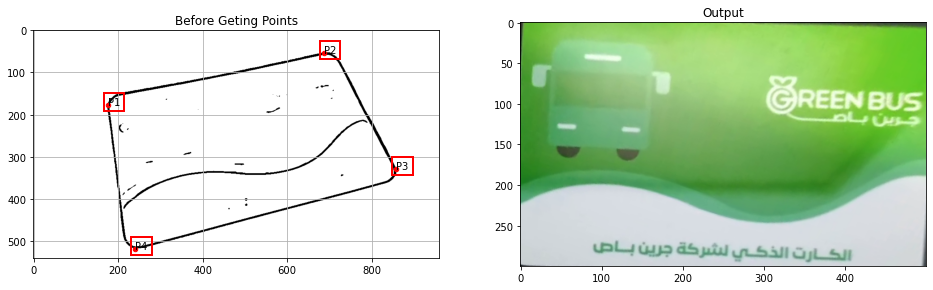

Iteration No: 531
0.5 < L1,4 / L2,3 < 2
Iteration No: 532
0.5 < L1,4 / L2,3 < 2
Iteration No: 533
0.5 < L1,4 / L2,3 < 2
Iteration No: 534
0.5 < L1,4 / L2,3 < 2
Iteration No: 535
0.5 < L1,4 / L2,3 < 2
Iteration No: 536
0.5 < L1,4 / L2,3 < 2
Iteration No: 537
0.5 < L1,4 / L2,3 < 2
Iteration No: 538
0.5 < L1,4 / L2,3 < 2
Iteration No: 539
0.5 < L1,4 / L2,3 < 2
Iteration No: 540
0.5 < L1,4 / L2,3 < 2
P1= (149, 165)
P2= (659, 45)
P3= (827, 315)
P4= (211, 503)


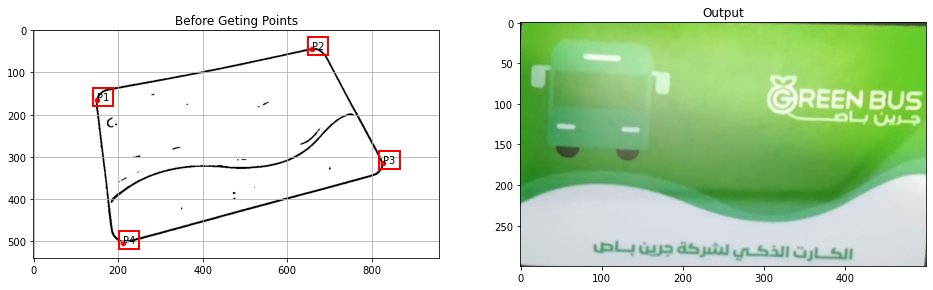

Iteration No: 541
0.5 < L1,4 / L2,3 < 2
Iteration No: 542
0.5 < L1,4 / L2,3 < 2
Iteration No: 543
0.5 < L1,4 / L2,3 < 2
Iteration No: 544
0.5 < L1,4 / L2,3 < 2
Iteration No: 545
0.5 < L1,4 / L2,3 < 2
Iteration No: 546
0.5 < L1,4 / L2,3 < 2
Iteration No: 547
0.5 < L1,4 / L2,3 < 2
Iteration No: 548
0.5 < L1,4 / L2,3 < 2
Iteration No: 549
0.5 < L1,4 / L2,3 < 2
Iteration No: 550
0.5 < L1,4 / L2,3 < 2
P1= (154, 158)
P2= (662, 37)
P3= (829, 303)
P4= (220, 492)


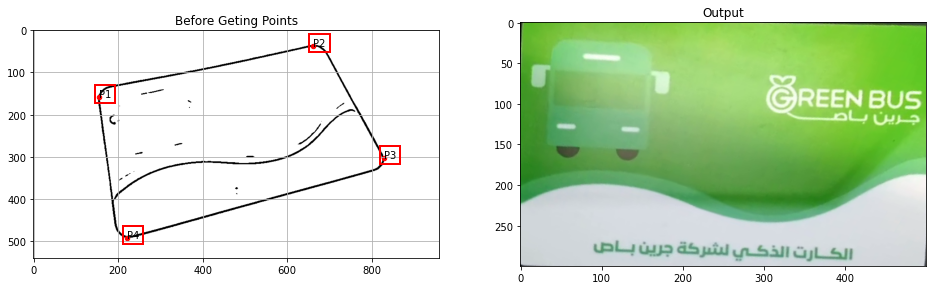

Iteration No: 551
0.5 < L1,4 / L2,3 < 2
Iteration No: 552
0.5 < L1,4 / L2,3 < 2
Iteration No: 553
0.5 < L1,4 / L2,3 < 2
Iteration No: 554
0.5 < L1,4 / L2,3 < 2
Iteration No: 555
0.5 < L1,4 / L2,3 < 2
Iteration No: 556
0.5 < L1,4 / L2,3 < 2
Iteration No: 557
0.5 < L1,4 / L2,3 < 2
Iteration No: 558
0.5 < L1,4 / L2,3 < 2
Iteration No: 559
0.5 < L1,4 / L2,3 < 2
Iteration No: 560
0.5 < L1,4 / L2,3 < 2
P1= (153, 153)
P2= (659, 30)
P3= (831, 297)
P4= (219, 486)


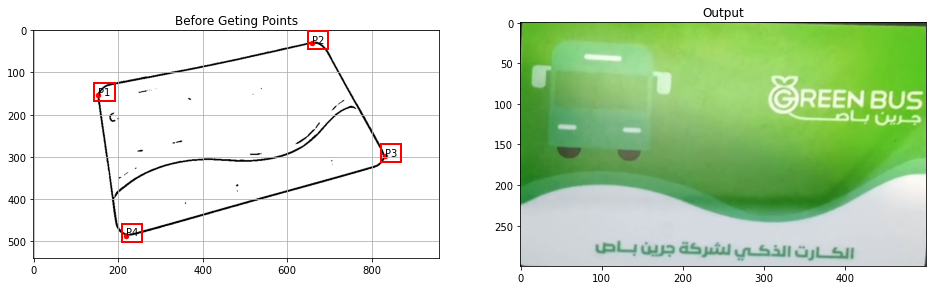

Iteration No: 561
0.5 < L1,4 / L2,3 < 2
Iteration No: 562
0.5 < L1,4 / L2,3 < 2
Iteration No: 563
0.5 < L1,4 / L2,3 < 2
Iteration No: 564
0.5 < L1,4 / L2,3 < 2
Iteration No: 565
0.5 < L1,4 / L2,3 < 2
Iteration No: 566
0.5 < L1,4 / L2,3 < 2
Iteration No: 567
0.5 < L1,4 / L2,3 < 2
Iteration No: 568
0.5 < L1,4 / L2,3 < 2
Iteration No: 569
0.5 < L1,4 / L2,3 < 2
Iteration No: 570
0.5 < L1,4 / L2,3 < 2
P1= (157, 142)
P2= (667, 18)
P3= (840, 284)
P4= (226, 474)


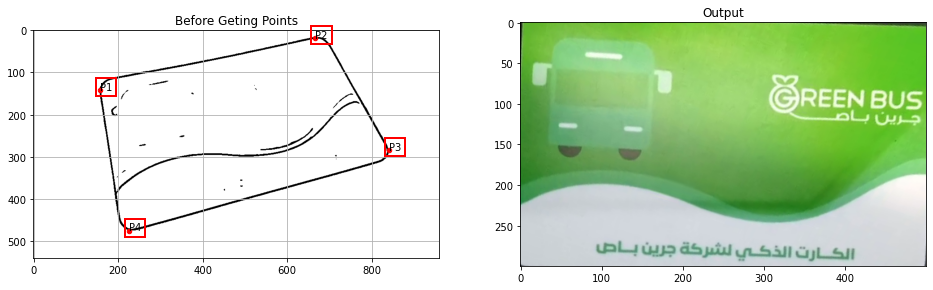

Iteration No: 571
0.5 < L1,4 / L2,3 < 2
Iteration No: 572
0.5 < L1,4 / L2,3 < 2
Iteration No: 573
0.5 < L1,4 / L2,3 < 2
Iteration No: 574
0.5 < L1,4 / L2,3 < 2
Iteration No: 575
0.5 < L1,4 / L2,3 < 2
Iteration No: 576
0.5 < L1,4 / L2,3 < 2
Iteration No: 577
0.5 < L1,4 / L2,3 < 2
Iteration No: 578
0.5 < L1,4 / L2,3 < 2
Iteration No: 579
0.5 < L1,4 / L2,3 < 2
Iteration No: 580
0.5 < L1,4 / L2,3 < 2
P1= (151, 142)
P2= (669, 21)
P3= (839, 291)
P4= (223, 476)


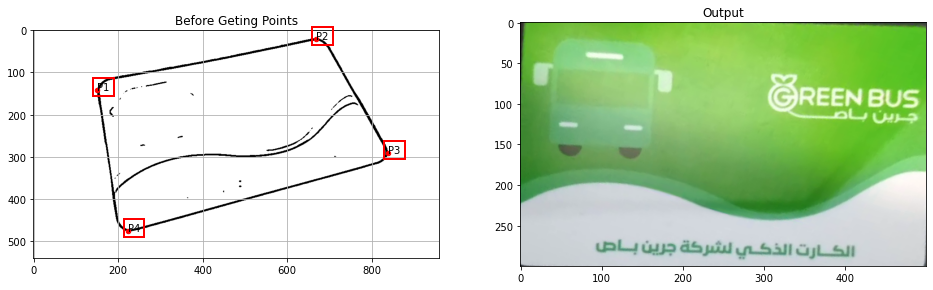

Iteration No: 581
0.5 < L1,4 / L2,3 < 2
Iteration No: 582
0.5 < L1,4 / L2,3 < 2
Iteration No: 583
0.5 < L1,4 / L2,3 < 2
Iteration No: 584
0.5 < L1,4 / L2,3 < 2
Iteration No: 585
0.5 < L1,4 / L2,3 < 2
Iteration No: 586
0.5 < L1,4 / L2,3 < 2
Iteration No: 587
0.5 < L1,4 / L2,3 < 2
Iteration No: 588
0.5 < L1,4 / L2,3 < 2
Iteration No: 589
0.5 < L1,4 / L2,3 < 2
Iteration No: 590
0.5 < L1,4 / L2,3 < 2
P1= (138, 156)
P2= (646, 31)
P3= (823, 296)
P4= (211, 490)


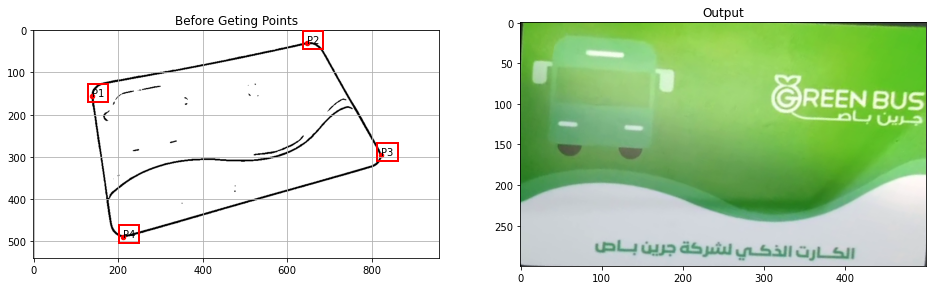

Iteration No: 591
0.5 < L1,4 / L2,3 < 2
Iteration No: 592
0.5 < L1,4 / L2,3 < 2
Iteration No: 593
0.5 < L1,4 / L2,3 < 2
Iteration No: 594
0.5 < L1,4 / L2,3 < 2
Iteration No: 595
0.5 < L1,4 / L2,3 < 2
Iteration No: 596
0.5 < L1,4 / L2,3 < 2
Iteration No: 597


In [5]:
live_perspective()